# Математический маятник

Математический маятник - классический пример гармонического осциллятора.

Пусть он состоит из материальной точки массой $m$, подвешенной на конце невесомой нерастяжимой нити или лёгкого стержня длины $L$, как показано на рис. 1. 

![Pendulum](https://github.com/jon/coolproject/raw/master/image/image.png)

Маятник движется только в одной плоскости, и трение отсутствует. Пусть $\theta$ обозначает угол между вертикальной осью и нитью, такой, что $\theta = 0$ означает положение равновесия. Предполагается, что потерь энергии в системе нет.

Теперь воспользуемся вторым законом Ньютона $F = ma$, чтобы найти дифференциальное уравнение, описывающее движение маятника. Пусть $t$ обозначает время. 

Движение маятника описывается уравнением:

$$ L\ddot{\theta}=L\dfrac{d^2\theta}{dt^2}=-g\sin(\theta) $$

In [2]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
plt.style.use('bmh')
figsize = (12, 5)
dpi = 600
g = 9.81
L = 50

### Аналитическое решение

Уравнение не может быть решено аналитически. Однако в области малых углов $sin(\theta)\approx\theta$ это уравнение может быть аппроксимировано как 
$$ L\ddot{\theta}\approx-g\theta $$
которое имеет решение:
$$\theta=\theta_0\cos(\omega t)$$
где $\theta_0$ - начальная позиция при $t=0$, а $\omega=\sqrt{g/L}$ - собственная частота колебаний

Это называется грамоническими колебаниями. Период колебаний равен $T=2\pi/\omega=2\pi\sqrt{L/g}$

In [3]:
def approx(t, theta0):
    return theta0*np.cos(np.sqrt(g/L)*t)

In [17]:
theta0 = np.pi/12
T = 500
h = 0.001
t = np.arange(0, T, h)
n = len(t)

def time_gen(h_loc):
    t_loc = np.arange(0, T, h_loc)
    return h_loc, t_loc, len(t_loc)

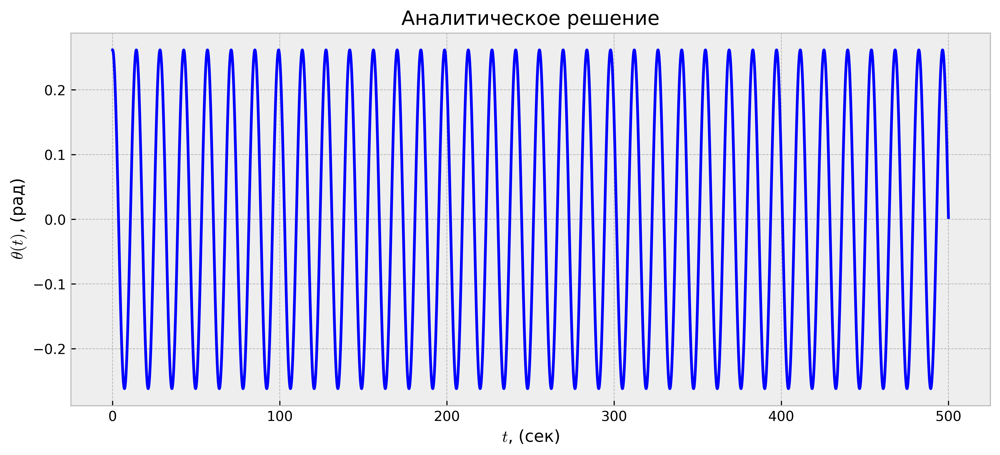

In [19]:
plt.figure(figsize=figsize, dpi=dpi)
plt.title("Аналитическое решение")
plt.plot(t, approx(t, theta0), "b-")
plt.xlabel(r"$t$, (сек)")
plt.ylabel(r"$\theta(t)$, (рад)")
plt.show()

### Численное решение

Запишем исходное дифференциальное уравнение в виде двух связанных дифференциальных уравнений первого порядка, введя угловую скорость $\omega=\dot\theta$:
$$d\omega = -\dfrac{g}{L}\theta\,dt$$
$$d\theta = \omega\,dt$$


In [6]:
def f(X):
    theta = X[0]
    w = X[1]
    dw = -(g/L)*(theta)
    dtheta = w
    return np.array([dtheta, dw])

## Явные одношаговые методы

### Метод Эйлера (1)

Явный одношаговый метод семейства Рунге-Кутты первого порядка.

Имеет погрешность на шаге $o(h^2)$ и погрешность в целом $O(h)$.

Таблица Бутчера для метода:

<!-- \begin{array}
{c|cccc}
0\\
\frac{1}{2} & \frac{1}{2}\\
\frac{1}{2} &0 &\frac{1}{2} \\
1& 0& 0& 1\\
\hline
& \frac{1}{6} &\frac{1}{3} &\frac{1}{3} &\frac{1}{6} 
\end{array} -->

\begin{array}
{|cc}
1 \\
\hline
0 
\end{array}

In [7]:
def euler_method(X0, h, n):
    X  = np.zeros([n, 2])
    X[0] = X0
    for i in range(n-1):
        k1 = f(X[i])
        X[i + 1] = X[i] + h*k1    
    return X[:, 0], X[:, 1] # [theta, w]

In [21]:
h1, t1, n1 = time_gen(0.001)
h2, t2, n2 = time_gen(0.01)
theta1, w1 = euler_method([theta0, 0], h1, n1) # метод Эйлера с шагом 0.001
theta2, w2 = euler_method([theta0, 0], h2, n2) # метод Эйлера с шагом 0.01

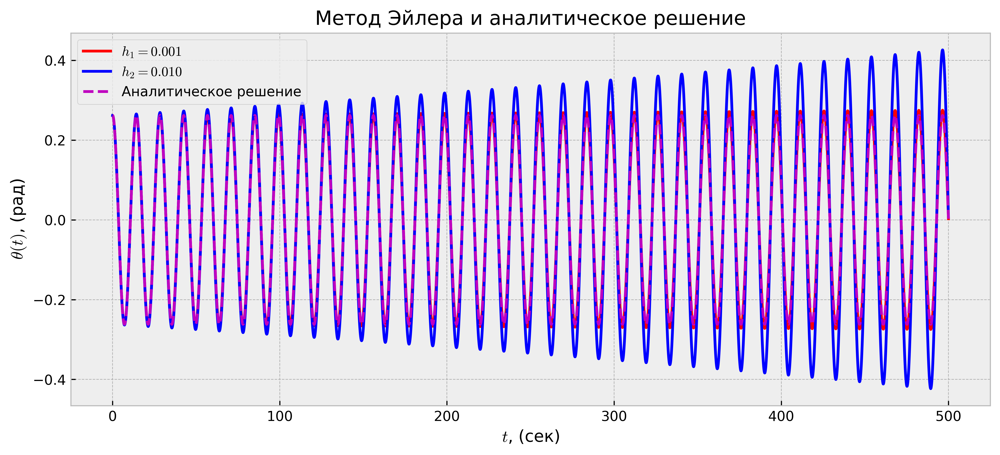

In [26]:
plt.figure(figsize=figsize, dpi=dpi)
plt.title("Метод Эйлера и аналитическое решение")
plt.plot(t1, theta1, "r-", label=r"$h_1=%.3f$"%(h1))
plt.plot(t2, theta2, "b-", label=r"$h_2=%.3f$"%(h2))
plt.plot(t, approx(t, theta0), "m--", label=r"Аналитическое решение")
plt.xlabel(r"$t$, (сек)")
plt.ylabel(r"$\theta(t)$, (рад)")
plt.legend(loc='upper left')
plt.show()

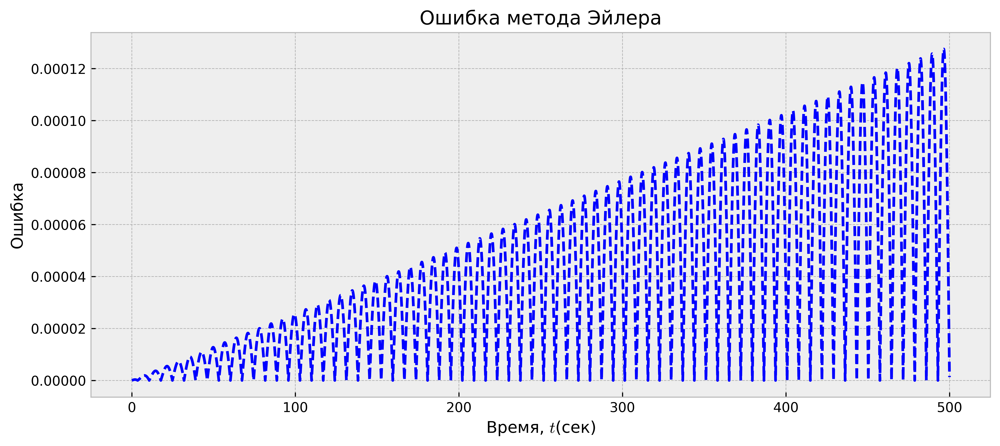

Максимальная ошибка равна  0.00012753996918407617


In [28]:
def error_Euler_analytic(h):
    he, te, ne = time_gen(h)
    thetae = approx(te, theta0)
    thetae1, we1 = euler_method([theta0, 0], he, ne)
    error = np.abs(thetae - thetae1)
    plt.figure(figsize=figsize, dpi=dpi)
    plt.plot(te, error, "b--")
    plt.xlabel("Время, $t$(сек)")
    plt.ylabel("Ошибка")
    plt.title("Ошибка метода Эйлера") 
    plt.show()
    return np.max(error)

max_error = error_Euler_analytic(0.00001)
print("Максимальная ошибка равна ", max_error)

### Метод средней точки (2)

Явный одношаговый метод семейства Рунге-Кутты второго порядка. 

Имеет погрешность на шаге $o(h^3)$ и погрешность в целом $O(h^2)$.

Таблица Бутчера для метода:

\begin{array}
{|cc}
0 \\
1/2 & 0 \\
\hline
0 & 1
\end{array}

In [11]:
def midpoint_method(X0, h, n):
    X  = np.zeros([n, 2])
    X[0] = X0
    for i in range(n-1):
        k1 = f(X[i])
        k2 = f(X[i] + h/2*k1)
        X[i+1] = X[i] + h*k2
    return X[:, 0], X[:, 1]

In [29]:
h1, t1, n1 = time_gen(0.01)
h2, t2, n2 = time_gen(0.001)
theta1, w1 = midpoint_method([theta0, 0], h1, n1)
theta2, w2 = midpoint_method([theta0, 0], h2, n2)

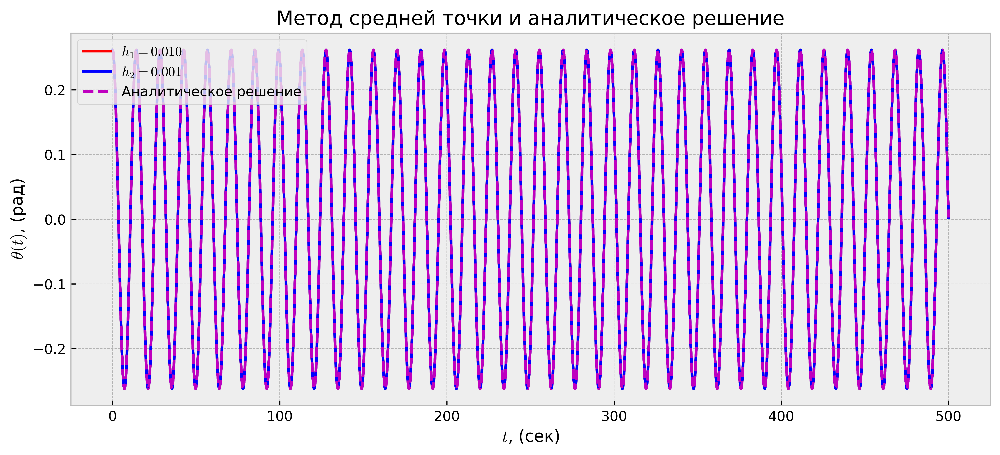

In [30]:
plt.figure(figsize=figsize, dpi=dpi)
plt.title("Метод средней точки и аналитическое решение")
plt.plot(t1, theta1, "r-", label=r"$h_1=%.3f$"%(h1))
plt.plot(t2, theta2, "b-", label=r"$h_2=%.3f$"%(h2))
plt.plot(t, approx(t, theta0), "m--", label=r"Аналитическое решение")
plt.xlabel(r"$t$, (сек)")
plt.ylabel(r"$\theta(t)$, (рад)")
plt.legend(loc='upper left')
plt.show()

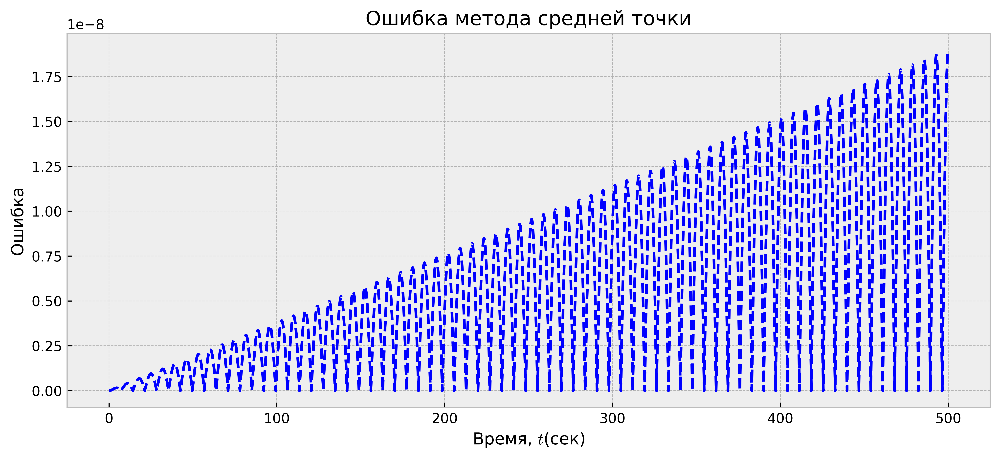

Максимальная ошибка равна  1.8958931982063915e-08


In [32]:
def error_midpoint_analytic(h):
    he, te, ne = time_gen(h)
    thetae = approx(te, theta0)
    thetae1, we1 = midpoint_method([theta0, 0], he, ne)
    error = np.abs(thetae - thetae1)
    plt.figure(figsize=figsize, dpi=dpi)
    plt.plot(te, error, "b--")
    plt.xlabel("Время, $t$(сек)")
    plt.ylabel("Ошибка")
    plt.title("Ошибка метода средней точки") 
    plt.show()
    return np.max(error)

max_error = error_midpoint_analytic(0.0001)
print("Максимальная ошибка равна ", max_error)

### Метод Рунге-Кутты (4)

Явный одношаговый метод семейства Рунге-Кутты четвёртого порядка. 
Имеет погрешность на шаге $o(h^5)$ и погрешность в целом $O(h^4)$.

Таблица Бутчера для метода:

\begin{array}
{|cccc}
0 \\
1/2 & 0 \\
0 & 1/2 & 0 \\
0 & 0 & 1 & 0 \\
\hline
1/6 & 1/3 & 1/3 & 1/6 
\end{array}

In [39]:
def RK4_method(X0, h, n):
    X  = np.zeros([n, 2])
    X[0] = X0
    for i in range(n-1):
        k1 = f(X[i])
        k2 = f(X[i] + h/2*k1)
        k3 = f(X[i] + h/2*k2)
        k4 =  f(X[i] + h*k3)
        X[i+1] = X[i] + h/6*(k1 + 2*k2 + 2*k3 + k4)
    return X[:, 0], X[:, 1]

In [34]:
h1, t1, n1 = time_gen(0.01)
theta1, w1 = RK4_method([theta0, 0], h1, n1)

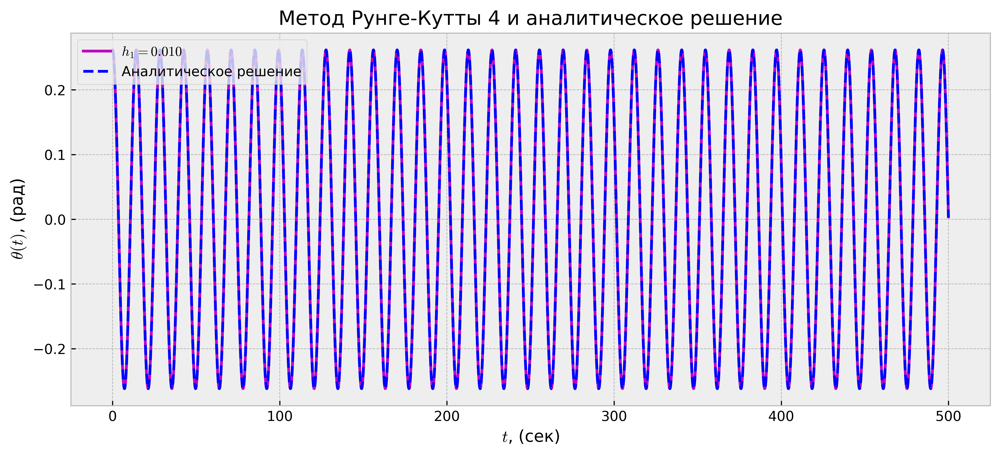

In [35]:
plt.figure(figsize=figsize, dpi=dpi)
plt.title("Метод Рунге-Кутты 4 и аналитическое решение")
plt.plot(t1, theta1, "m", label=r"$h_1=%.3f$"%(h1))
plt.plot(t, approx(t, theta0), "b--", label=r"Аналитическое решение")
plt.xlabel(r"$t$, (сек)")
plt.ylabel(r"$\theta(t)$, (рад)")
plt.legend(loc='upper left')
plt.show()

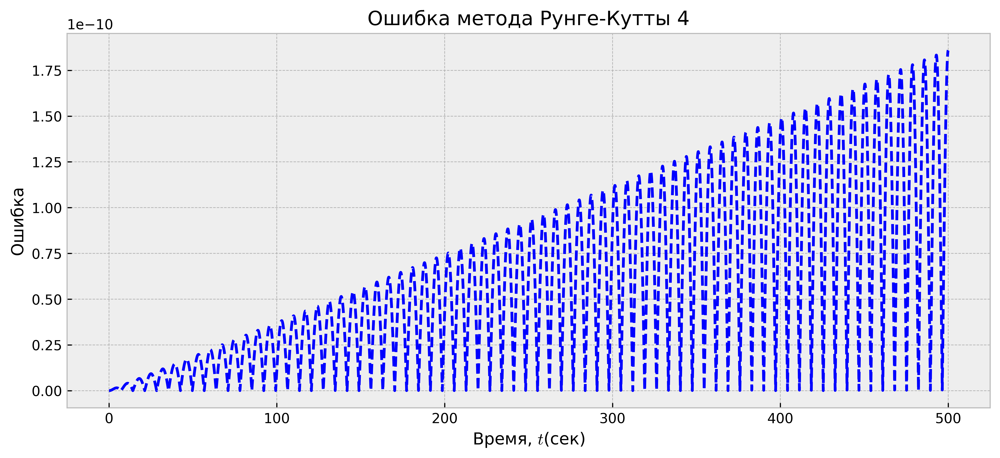

Максимальная ошибка равна  1.8595432485501995e-10


In [45]:
def error_RK4_analytic(h):
    he, te, ne = time_gen(h)
    thetae = approx(te, theta0)
    thetae1, we1 = RK4_method([theta0, 0], he, ne)
    error = np.abs(thetae - thetae1)
    plt.figure(figsize=figsize, dpi=dpi)
    plt.plot(te, error, "b--")
    plt.xlabel("Время, $t$(сек)")
    plt.ylabel("Ошибка")
    plt.title("Ошибка метода Рунге-Кутты 4") 
    plt.show()
    return np.max(error)

max_error = error_RK4_analytic(0.01)
print("Максимальная ошибка равна ", max_error)

## Явные одношаговые вложенные методы

### Метод Богацкого-Шампина (3(2))

Метод Богацкого-Шампина - это метод Рунге-Кутты третьего порядка с четырьмя этапами со свойством FSAL, поэтому он использует примерно три вычисления функции на шаг.

Таблица Бутчера для метода:

\begin{array}
{|cccc}
0 \\
1/2 & 0 \\
0 & 3/4 & 0 \\
2/9 & 1/3 & 4/9 & 0 \\
\hline
2/9 & 1/3 & 4/9 & 0 \\
\hline
7/24 & 1/4 & 1/3 & 1/8 
\end{array}

In [46]:
def BS_method(X0, h, n):
    X  = np.zeros([n, 2])
    X[0] = X0
    for i in range(n-1):
        k1 = f(X[i])
        k2 = f(X[i] + h/2*k1)
        k3 = f(X[i] + (3*h)/4*k2)
        X[i+1] = X[i] + (2*h)/9*k1 + (1*h)/3*k2 + (4*h)/9*k3
        k4 =  f(X[i+1])
        X[i+1] = X[i] + h/24*(7*k1 + 6*k2 + 8*k3 + 3*k4)        
    return X[:, 0], X[:, 1]

In [51]:
h1, t1, n1 = time_gen(0.01)
theta1, w1 = BS_method([theta0, 0], h1, n1)

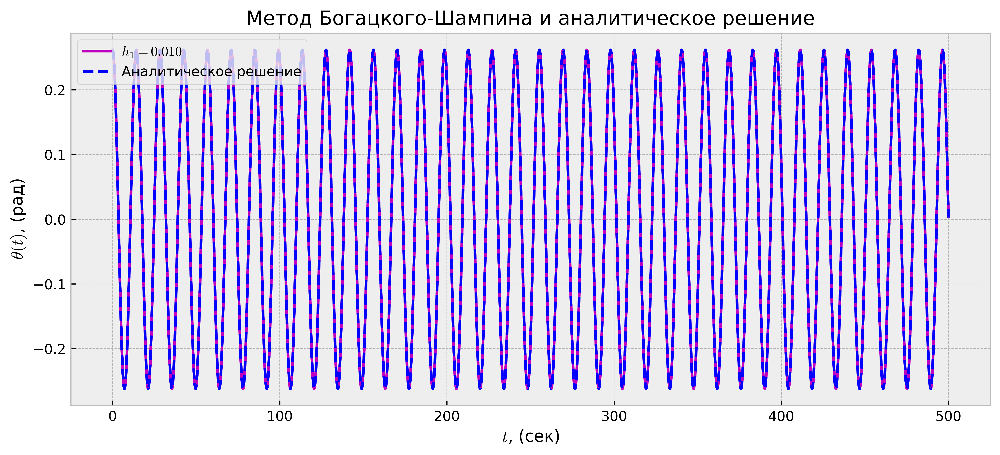

In [52]:
plt.figure(figsize=figsize, dpi=dpi)
plt.title("Метод Богацкого-Шампина и аналитическое решение")
plt.plot(t1, theta1, "m", label=r"$h_1=%.3f$"%(h1))
plt.plot(t, approx(t, theta0), "b--", label=r"Аналитическое решение")
plt.xlabel(r"$t$, (сек)")
plt.ylabel(r"$\theta(t)$, (рад)")
plt.legend(loc='upper left')
plt.show()

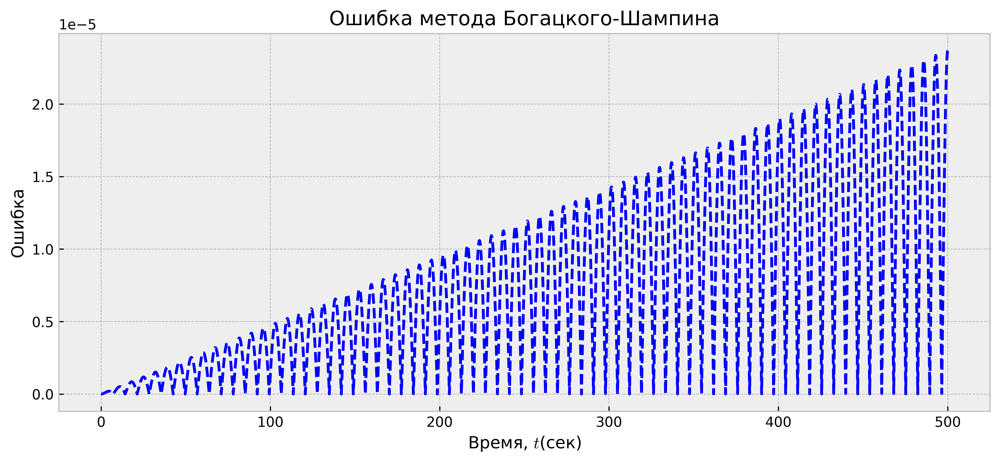

Максимальная ошибка равна  2.3693385198763923e-05


In [55]:
def error_BS_analytic(h):
    he, te, ne = time_gen(h)
    thetae = approx(te, theta0)
    thetae1, we1 = BS_method([theta0, 0], he, ne)
    error = np.abs(thetae - thetae1)
    plt.figure(figsize=figsize, dpi=dpi)
    plt.plot(te, error, "b--")
    plt.xlabel("Время, $t$(сек)")
    plt.ylabel("Ошибка")
    plt.title("Ошибка метода Богацкого-Шампина") 
    plt.show()
    return np.max(error)

max_error = error_BS_analytic(0.01)
print("Максимальная ошибка равна ", max_error)